## Der Schuss auf einen fallenden Affen
Darstellung der Bahnkurve eines Schusses, der in direkter
Linie auf einen Affen abgegeben wird. Zeitgleich mit dem
Schuss lässt sich der Affe fallen.

In dieser Animation kann der Affe durch ein kleines Bild
dargestellt werden.

&copy; Physik mit Python, Oliver Natt, Springer, 2022. <br>
TUM-Studierende haben Zugang zu dem Buch über www.ub.tum.de. 

In [1]:
# Imports
# Numpy erlaubt das effiziente Rechnen mit Arrays. Rechenoperationen auf Numpy arrays werden im Hintergrund mit anderen Programmiersprachen wie C ausgeführt,
# die deutlich schneller sind, als natives Python. Näheres findet ihr auf numpy.org.
import numpy as np                  
# Matplotlib ist ein mächtiges Grafikpaket für jegliche Art von Plots. Hier wird es für die Erstellung der Animation benutzt.
import matplotlib as mpl
# Matplotlib Animation ist ein Packet um bewegte Grafiken zu kreieren. Der Output wird später von IPython.display übernommen.
import matplotlib.animation
# Pyplot ist ein Unterpaket von matplotlib. Es erlaubt die einfache Erstellung von Plots und Fits. Man könnte es auch direkt per mpl.pyplot aufrufen, da es bereits zusammen mit
# matplotlib importiert wurde, allerdings ist es in der Physik praktisch zum Standard geworden es als "plt" zu importieren.
import matplotlib.pyplot as plt
# IPython ist eine ganze Software-Suite welche gut integriert mit Jupyter-Notebooks ist. IPython.distplay wird hier genutzt um den grafischen output von Matplotlib.animation interaktiv
# im Jupyter-Notebook darzustellen.
from IPython.display import HTML

# Definition der Anfrangsbedingungen und Berechnung der Bewegungen

In [2]:
# Anfangsort des Pfeils [m].
r0_pfeil = np.array([0.0, 0.0])
# Anfangsort des Affen [m].
r0_affe = np.array([3.0, 2.0])
# Anfangsgeschwindigkeit [m/s].
betrag_v0_pfeil = 9.0
# Erdbeschleunigung [m/s²].
g = 9.81
# Zeitschrittweite [s].
dt = 0.001

# Berechne den Vektor der Abschussgeschwindigkeit.
r0_pfeil_affe = r0_affe - r0_pfeil
v0 = betrag_v0_pfeil * r0_pfeil_affe / np.linalg.norm(r0_pfeil_affe)

# Lege den Vektor der Erdbeschleunigung fest.
a = np.array([0, -g])

# Berechne den Zeitpunkt, zu dem der Pfeil den Affen trifft.
t_ende = (r0_affe[0] - r0_pfeil[0]) / v0[0]

# Erzeuge ein Array von Zeitpunkten und berechne die Position
# von Pfeil und Affe zu jedem Zeitpunkt.
t = np.arange(0, t_ende, dt).reshape(-1, 1)
r_pfeil = r0_pfeil + v0 * t + 0.5 * a * t**2
r_affe = r0_affe + 0.5 * a * t**2

# Erzeugung der Grafik

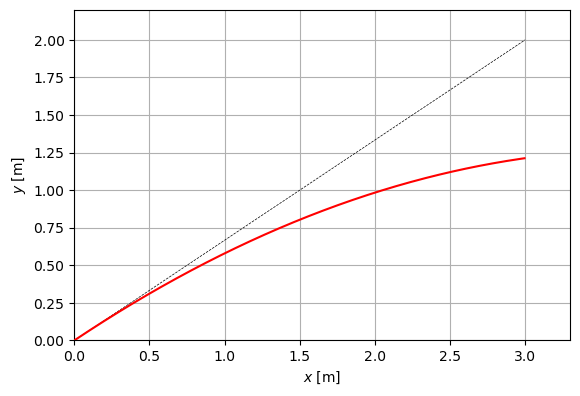

In [3]:
# Erzeuge eine Figure und ein Axes-Objekt.
fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
ax.set_xlim(0, 1.1 * max(r0_pfeil[0], r0_affe[0]))
ax.set_ylim(0, 1.1 * max(r0_pfeil[1], r0_affe[1]))
ax.set_xlabel('$x$ [m]')
ax.set_ylabel('$y$ [m]')
ax.set_aspect('equal')
ax.grid()

# Plotte die Ziellinie des Schusses als Gerade.
plot_gerade = ax.plot([r0_pfeil[0], r0_affe[0]],
                      [r0_pfeil[1], r0_affe[1]],
                      '--', color='black', lw='0.5')

# Plotte die Bahnkurve des Pfeils.
plot_bahn_pfeil, = ax.plot(r_pfeil[:, 0], r_pfeil[:, 1],
                           color='red', zorder=5)

# Erzeuge je einen Punkt für die Position der beiden Körper.
plot_pfeil, = ax.plot([], [], 'o', color='red', zorder=5)
plot_affe, = ax.plot([], [], 'o', color='blue', zorder=4)

# Mit oder ohne Bild.
Hier könnt ihr euch entscheiden, ob ihr noch ein Bild für den Affen hinzufügt.
Dazu ```mit_bild = True``` setzen und ein Bild in den selben Ordner wie das Notebook kopieren und "Affe.png" nennen bzw. den Bildnamen unten abändern.
Nur .png und .jpg Grafiken funktionieren, zudem müsst ihr je nach Größe auch den ```zoom```-Faktor anpassen.

In [4]:
# Stelle den Affen als Bild dar.
mit_bild = False
if mit_bild == True:
    bild = mpl.offsetbox.OffsetImage('Affe.png', zoom=0.12)
    box_affe = mpl.offsetbox.AnnotationBbox(bild, (0, 0), frameon=False)
    ax.add_artist(box_affe)

# Update Funktion
In dieser Funktion wird die Position des Pfeils und des Affen für einen ausgewählten Zeitschritt n in die matplotlib Grafik eingetragen.

In [5]:
def update(n):
    """Aktualisiere die Grafik zum n-ten Zeitschritt."""
    # Aktualisiere die Position der beiden Punkte.
    plot_pfeil.set_data(r_pfeil[n].reshape(-1, 1))
    plot_affe.set_data(r_affe[n].reshape(-1, 1))

    # Aktualisiere die Position des Affenbildes.
    if mit_bild == True:
        box_affe.xybox = r_affe[n]
    else:
        box_affe = None
    # Plotte die Bahnkurve des Pfeils bis zum aktuellen
    # Zeitpunkt.
    plot_bahn_pfeil.set_data(r_pfeil[:n + 1, 0], r_pfeil[:n + 1, 1])

    return plot_pfeil, plot_affe, plot_bahn_pfeil, box_affe

# Erzeugung der Animation
Das Grafikobjekt "fig" und die "update" Funktion werden an die matplotlib Animation Funktion übergeben. Diese erstellt nun einen Animation Frame für Frame indem sie die Postionen des Pfeils und des Affen für alle Zeitschritte n in der update Funktion durch geht.



In [6]:
# Erzeuge das Animationsobjekt und starte die Animation
ani = mpl.animation.FuncAnimation(fig, update, frames=t.size,
                                  interval=30, blit=False,
                                  repeat_delay=1000)
# Dies verhindert, das die Grafik ein zweites mal von pyplot ausgegeben wird. Ist nicht zwingend notwendig
plt.close()

# Das HTML paket erlaubt es die oben erzeugte Animation im Jupyter-Notebook direkt anzuzeigen. 
# Dafür wird die Animation zunächst in javascript umgewandelt und dann per HTML im editor angezeigt.
HTML(ani.to_jshtml())


# Copyright

&copy; Physik mit Python, Oliver Natt, Springer, 2022. <br>
TUM-Studierende haben Zugang zu dem Buch über www.ub.tum.de. 

Copyright (c) 2023 Springer Nature Code Inside

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.


